# Integrate All ten datasets in one Visualization (~500k cells)

### Import modules, set paths, load files:

In [13]:
# !pip install scanpy
# !pip install ipywidgets
import scanpy as sc
import anndata
import numpy as np
import pandas as pd
import os

from tqdm import tqdm

In [14]:
# !pip install scarches
# !pip install -U pandas==2.0

import scarches as sca

In [15]:
# https://github.com/huggingface/transformers/issues/29763
# pip install transformers==4.37.2
import torch

In [16]:
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

## Import the cell type information from the CSV file

1. create high-level labels based on biology knowledge

https://github.com/juyingnan/UCE/blob/main/hubmap/preview_umap_cat.py 

https://github.com/juyingnan/UCE/blob/main/hubmap/dendrogram.py)

2. normalize the data


In [17]:
high_level = {
    'club cell:nasal': 'Epithelial Cells',
    'multi-ciliated epithelial cell:nasal': 'Epithelial Cells',
    'nasal mucosa goblet cell': 'Epithelial Cells',
    'brush cell of trachebronchial tree': 'Epithelial Cells',
    'tracheobronchial goblet cell': 'Epithelial Cells',
    'multi-ciliated epithelial cell:non-nasal': 'Epithelial Cells',
    'type I pneumocyte': 'Epithelial Cells',
    'type II pneumocyte': 'Epithelial Cells',
    'type II pneumocyte:proliferating': 'Epithelial Cells',
    'alveolar type 1 fibroblast cell': 'Epithelial Cells',
    'alveolar type 2 fibroblast cell': 'Epithelial Cells',
    'serous secreting cell:activated': 'Epithelial Cells',
    'serous secreting cell of bronchus submucosal gland': 'Epithelial Cells',
    'serous secreting cell:nasal': 'Epithelial Cells',
    'airway submucosal gland collecting duct epithelial cell': 'Epithelial Cells',
    'respiratory basal cell': 'Epithelial Cells',
    'respiratory basal cell:resting': 'Epithelial Cells',
    'ionocyte': 'Epithelial Cells',
    'club cell:non-nasal': 'Epithelial Cells',
    'CD1c-positive myeloid dendritic cell': 'Immune Cells',
    'alveolar macrophage': 'Immune Cells',
    'Alveolar Mφ proliferating': 'Immune Cells',
    'monocyte': 'Immune Cells',
    'Non-classical monocytes': 'Immune Cells',
    'Monocyte-derived Mφ': 'Immune Cells',
    'Interstitial Mφ perivascular': 'Immune Cells',
    'natural killer cell': 'Immune Cells',
    'plasmacytoid dendritic cell, human': 'Immune Cells',
    'CD4-positive helper T cell': 'Immune Cells',
    'effector memory CD8-positive, alpha-beta T cell': 'Immune Cells',
    'T cell:proliferating': 'Immune Cells',
    'B cell': 'Immune Cells',
    'plasma cell': 'Immune Cells',
    'mast cell': 'Immune Cells',
    'endothelial cell of venule:pulmonary': 'Vascular Cells',
    'alveolar capillary type 2 endothelial cell': 'Vascular Cells',
    'endothelial cell of venule': 'Vascular Cells',
    'endothelial cell of artery': 'Vascular Cells',
    'capillary endothelial cell': 'Vascular Cells',
    'endothelial cell of lymphatic vessel:differentiating': 'Vascular Cells',
    'endothelial cell of lymphatic vessel:mature': 'Vascular Cells',
    'smooth muscle cell': 'Muscle Cells',
    'lung pericyte': 'Support Cells',
    'myofibroblast cell': 'Support Cells',
    'pulmonary interstitial fibroblast': 'Support Cells',
    'deuterosomal cell': 'Specialized Cells',
    'Transitional Club-AT2': 'Specialized Cells'
}


# Strategy 2: Cell Lineage and Type
detailed_level = {
    'club cell:nasal': 'Nasal Epithelium',
    'multi-ciliated epithelial cell:nasal': 'Nasal Epithelium',
    'nasal mucosa goblet cell': 'Nasal Epithelium',
    'brush cell of trachebronchial tree': 'Tracheobronchial Tree',
    'tracheobronchial goblet cell': 'Tracheobronchial Tree',
    'multi-ciliated epithelial cell:non-nasal': 'Tracheobronchial Tree',
    'type I pneumocyte': 'Alveolar Epithelium',
    'type II pneumocyte': 'Alveolar Epithelium',
    'type II pneumocyte:proliferating': 'Alveolar Epithelium',
    'alveolar type 1 fibroblast cell': 'Alveolar Epithelium',
    'alveolar type 2 fibroblast cell': 'Alveolar Epithelium',
    'serous secreting cell:activated': 'Secretory Cells',
    'serous secreting cell of bronchus submucosal gland': 'Secretory Cells',
    'serous secreting cell:nasal': 'Secretory Cells',
    'airway submucosal gland collecting duct epithelial cell': 'Secretory Cells',
    'respiratory basal cell': 'Basal Cells',
    'respiratory basal cell:resting': 'Basal Cells',
    'ionocyte': 'Specialized Epithelial Cells',
    'club cell:non-nasal': 'Specialized Epithelial Cells',
    'CD1c-positive myeloid dendritic cell': 'Myeloid Lineage',
    'alveolar macrophage': 'Myeloid Lineage',
    'Alveolar Mφ proliferating': 'Myeloid Lineage',
    'monocyte': 'Myeloid Lineage',
    'Non-classical monocytes': 'Myeloid Lineage',
    'Monocyte-derived Mφ': 'Myeloid Lineage',
    'Interstitial Mφ perivascular': 'Myeloid Lineage',
    'natural killer cell': 'Lymphoid Lineage',
    'plasmacytoid dendritic cell, human': 'Lymphoid Lineage',
    'CD4-positive helper T cell': 'Lymphoid Lineage',
    'effector memory CD8-positive, alpha-beta T cell': 'Lymphoid Lineage',
    'T cell:proliferating': 'Lymphoid Lineage',
    'B cell': 'Lymphoid Lineage',
    'plasma cell': 'Lymphoid Lineage',
    'mast cell': 'Mast Cells',
    'myofibroblast cell': 'Fibroblasts and Myofibroblasts',
    'pulmonary interstitial fibroblast': 'Fibroblasts and Myofibroblasts',
    'lung pericyte': 'Pericytes',
    'endothelial cell of venule:pulmonary': 'Vascular Endothelium',
    'endothelial cell of venule': 'Vascular Endothelium',
    'alveolar capillary type 2 endothelial cell': 'Vascular Endothelium',
    'endothelial cell of artery': 'Vascular Endothelium',
    'capillary endothelial cell': 'Vascular Endothelium',
    'endothelial cell of lymphatic vessel:differentiating': 'Lymphatic Endothelium',
    'endothelial cell of lymphatic vessel:mature': 'Lymphatic Endothelium',
    'Transitional Club-AT2': 'Transitional Cells',
    'alveolar type 1 fibroblast cell': 'Alveolar Cells',
    'alveolar type 2 fibroblast cell': 'Alveolar Cells',
    'endothelial cell of lymphatic vessel': 'Miscellaneous'
}

In [18]:
def import_cell_type(filename_csv, filename_h5ad, file_label):
    df_adata = pd.read_csv(filename_csv, index_col=0)
    path_input_data = filename_h5ad
    reference_adata = sc.read(path_input_data)

    list_cells = reference_adata.obs.index.tolist()
    list_cell_types = []
    file_label_list = []
    high_level_list = []
    detailed_level_list = []

    error_counts = 0
    error_label = 'ERROR'

    for i in tqdm(range(len(list_cells))):
        index_example = list_cells[i]
        file_label_list.append(file_label)
        
        try:
            cell_type_example = df_adata.loc[index_example, 'CL_Label']
            list_cell_types.append(cell_type_example)
        except:
            error_counts += 1
            list_cell_types.append(error_label)
            
    print('Error count is:', error_counts)
    print('Error percentage is:', error_counts*100/len(list_cells),'%')
    
    error_counts = 0
    error_label = 'ERROR_high'
            
    for i in tqdm(range(len(list_cells))):
        index_example = list_cells[i]
        
        try:
            cell_type_example = df_adata.loc[index_example, 'CL_Label']
            high_level_list.append(high_level[cell_type_example])
        except:
            error_counts += 1
            high_level_list.append(error_label)
            
    print('Error_high count is:', error_counts)
    print('Error_high percentage is:', error_counts*100/len(list_cells),'%')
    
    error_counts = 0
    error_label = 'ERROR_detail'
            
    for i in tqdm(range(len(list_cells))):
        index_example = list_cells[i]
        
        try:
            cell_type_example = df_adata.loc[index_example, 'CL_Label']
            detailed_level_list.append(detailed_level[cell_type_example])
        except:
            error_counts += 1
            detailed_level_list.append(error_label)

    print('Error_detail count is:', error_counts)
    print('Error_detail percentage is:', error_counts*100/len(list_cells),'%')

    reference_adata.obs["cell_type"] = list_cell_types
    reference_adata.obs["cell_type_high"] = high_level_list
    reference_adata.obs["cell_type_detail"] = detailed_level_list

    # choose layers

    reference_adata.X = reference_adata.layers["spliced_unspliced_sum"]
 
    # UCE load fix, suggested from Yingnan Ju
    # Replace NaN values in the 'hugo_symbol' column with a placeholder
    placeholder = "Unknown"

    # Convert 'category' column to categorical
    reference_adata.var['hugo_symbol'] = reference_adata.var['hugo_symbol'].astype('category')

    # Add new category 'Unknown' dynamically
    reference_adata.var['hugo_symbol'] = reference_adata.var['hugo_symbol'].cat.add_categories([placeholder])

    # Now you can safely assign 'Unknown' to the column
    reference_adata.var['hugo_symbol'].fillna(placeholder, inplace=True)
    
    # Create labels for this file
    reference_adata.obs["file_label"] = file_label_list
    

    return reference_adata

In [19]:
filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_853-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_853.h5ad'
reference_adata_1 = import_cell_type(filename_csv, filename_h5ad, 'expr_853')

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_986-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_986.h5ad'
reference_adata_2 = import_cell_type(filename_csv, filename_h5ad, 'expr_986')

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_369-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_369.h5ad'
reference_adata_3 = import_cell_type(filename_csv, filename_h5ad, 'expr_369')

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_282-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_282.h5ad'
reference_adata_4 = import_cell_type(filename_csv, filename_h5ad, 'expr_282')

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_672-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_672.h5ad'
reference_adata_5 = import_cell_type(filename_csv, filename_h5ad, 'expr_672')

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_258-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_258.h5ad'
reference_adata_6 = import_cell_type(filename_csv, filename_h5ad, 'expr_258')

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_633-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_633.h5ad'
reference_adata_7 = import_cell_type(filename_csv, filename_h5ad, 'expr_633')

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_384-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_384.h5ad'
reference_adata_8 = import_cell_type(filename_csv, filename_h5ad, 'expr_384')

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_643-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_643.h5ad'
reference_adata_9 = import_cell_type(filename_csv, filename_h5ad, 'expr_643')

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_967-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_967.h5ad'
reference_adata_10 = import_cell_type(filename_csv, filename_h5ad, 'expr_967')

100%|██████████████████████████████████████████████████████████████████████████████████| 100921/100921 [00:00<00:00, 176815.82it/s]


Error count is: 0
Error percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100921/100921 [00:00<00:00, 176026.78it/s]


Error_high count is: 1
Error_high percentage is: 0.0009908740499995046 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100921/100921 [00:00<00:00, 174581.97it/s]


Error_detail count is: 860
Error_detail percentage is: 0.8521516829995739 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100984/100984 [00:00<00:00, 181497.72it/s]


Error count is: 0
Error percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100984/100984 [00:00<00:00, 182045.41it/s]


Error_high count is: 0
Error_high percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100984/100984 [00:00<00:00, 182201.95it/s]


Error_detail count is: 80
Error_detail percentage is: 0.07922047056959518 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100957/100957 [00:00<00:00, 183819.88it/s]


Error count is: 0
Error percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100957/100957 [00:00<00:00, 181904.17it/s]


Error_high count is: 0
Error_high percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100957/100957 [00:00<00:00, 183824.83it/s]


Error_detail count is: 632
Error_detail percentage is: 0.6260090929801797 %


100%|████████████████████████████████████████████████████████████████████████████████████| 11236/11236 [00:00<00:00, 186545.59it/s]


Error count is: 0
Error percentage is: 0.0 %


100%|████████████████████████████████████████████████████████████████████████████████████| 11236/11236 [00:00<00:00, 182547.53it/s]


Error_high count is: 0
Error_high percentage is: 0.0 %


100%|████████████████████████████████████████████████████████████████████████████████████| 11236/11236 [00:00<00:00, 180398.79it/s]


Error_detail count is: 70
Error_detail percentage is: 0.622997508009968 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 8688/8688 [00:00<00:00, 187383.60it/s]


Error count is: 0
Error percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 8688/8688 [00:00<00:00, 174927.94it/s]


Error_high count is: 0
Error_high percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 8688/8688 [00:00<00:00, 184495.69it/s]


Error_detail count is: 76
Error_detail percentage is: 0.8747697974217311 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 4899/4899 [00:00<00:00, 183514.14it/s]


Error count is: 0
Error percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 4899/4899 [00:00<00:00, 181946.05it/s]


Error_high count is: 0
Error_high percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 4899/4899 [00:00<00:00, 181449.58it/s]


Error_detail count is: 42
Error_detail percentage is: 0.8573178199632578 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 8201/8201 [00:00<00:00, 189921.75it/s]


Error count is: 0
Error percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 8201/8201 [00:00<00:00, 183683.48it/s]


Error_high count is: 0
Error_high percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 8201/8201 [00:00<00:00, 188539.30it/s]


Error_detail count is: 16
Error_detail percentage is: 0.19509815876112668 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 8430/8430 [00:00<00:00, 188170.46it/s]


Error count is: 0
Error percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 8430/8430 [00:00<00:00, 189672.47it/s]


Error_high count is: 0
Error_high percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 8430/8430 [00:00<00:00, 187029.79it/s]


Error_detail count is: 56
Error_detail percentage is: 0.66429418742586 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100955/100955 [00:00<00:00, 185255.85it/s]


Error count is: 0
Error percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100955/100955 [00:00<00:00, 178322.01it/s]


Error_high count is: 0
Error_high percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████| 100955/100955 [00:00<00:00, 185566.55it/s]


Error_detail count is: 1222
Error_detail percentage is: 1.2104402951810211 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 7980/7980 [00:00<00:00, 186596.42it/s]


Error count is: 0
Error percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 7980/7980 [00:00<00:00, 183717.35it/s]


Error_high count is: 0
Error_high percentage is: 0.0 %


100%|██████████████████████████████████████████████████████████████████████████████████████| 7980/7980 [00:00<00:00, 181811.27it/s]

Error_detail count is: 90
Error_detail percentage is: 1.1278195488721805 %


In [20]:
ann_data_list = [reference_adata_1, reference_adata_2, reference_adata_3, reference_adata_4
                              , reference_adata_5, reference_adata_6, reference_adata_7, reference_adata_8
                              , reference_adata_9, reference_adata_10]

In [21]:
combined_ann_data = ann_data_list[0].concatenate(ann_data_list[1:])

In [22]:
sc.pp.filter_cells(combined_ann_data, min_genes=200)
sc.pp.filter_genes(combined_ann_data, min_cells=3)
sc.pp.normalize_total(combined_ann_data, target_sum=1e4)
sc.pp.log1p(combined_ann_data)
sc.pp.highly_variable_genes(combined_ann_data, n_top_genes=2000)

In [23]:
adata_concat = combined_ann_data
adata_concat

AnnData object with n_obs × n_vars = 259531 × 53221
    obs: 'cell_type', 'cell_type_high', 'cell_type_detail', 'file_label', 'batch', 'n_genes'
    var: 'hugo_symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'spliced', 'spliced_unspliced_sum', 'unspliced'

In [25]:
sc.pp.neighbors(adata_concat)
sc.tl.umap(adata_concat)

         Falling back to preprocessing with `sc.pp.pca` and default params.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


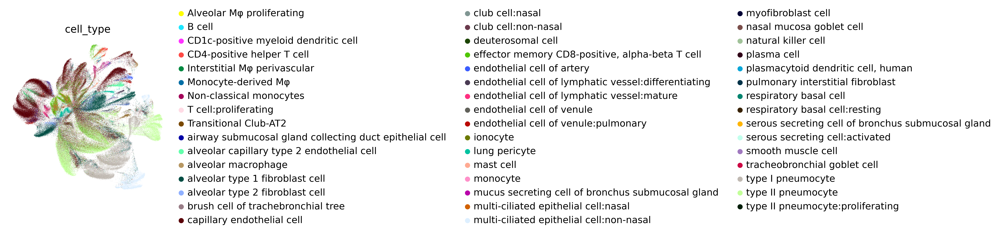

In [26]:
sc.pl.umap(adata_concat, color=['cell_type'], wspace=0.5, frameon=False)

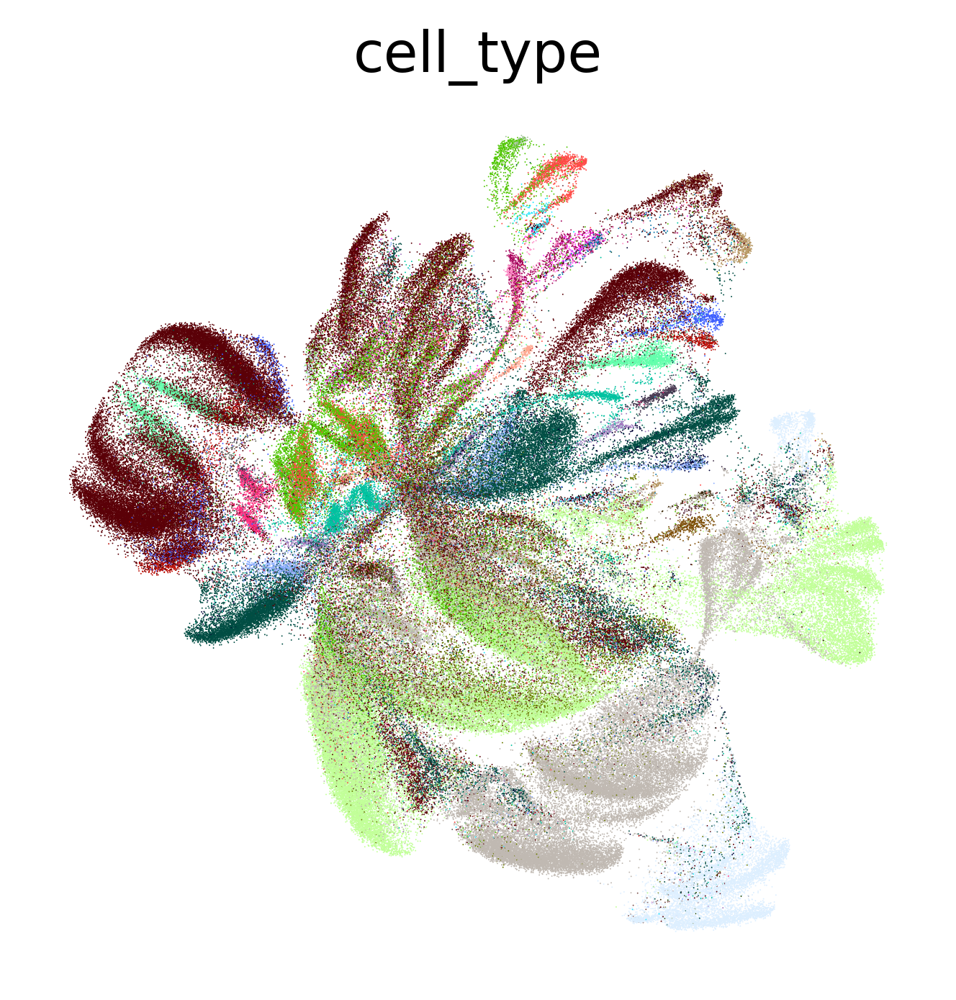

In [27]:
sc.pl.umap(adata_concat, color=['cell_type'], frameon=False, legend_loc = 'best')

# Visualisation by different level of cell type labels

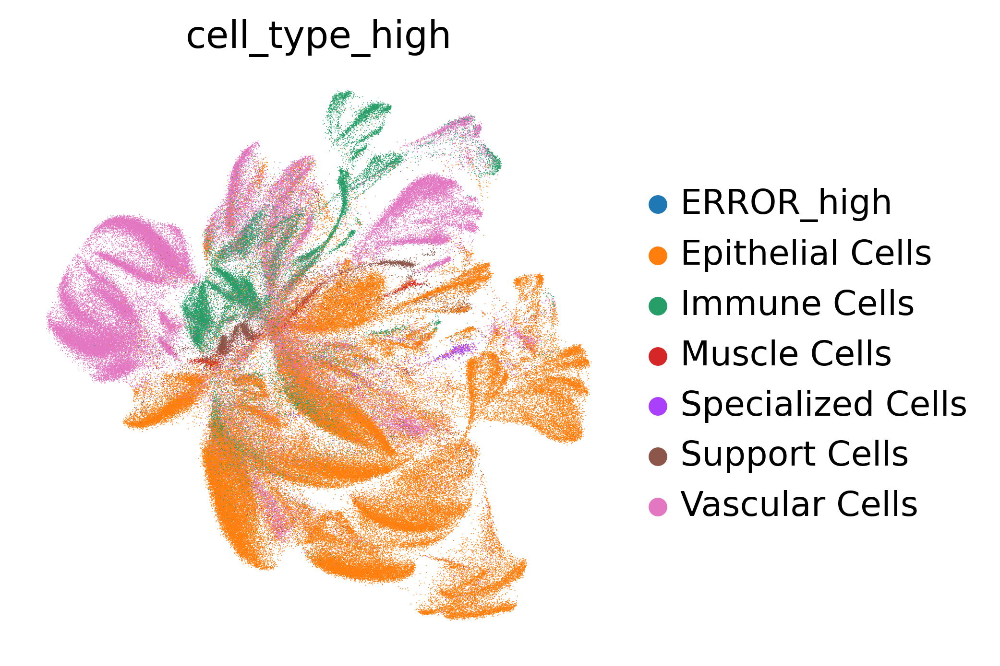

In [28]:
sc.pl.umap(adata_concat, color=['cell_type_high'], wspace=0.5, frameon=False)

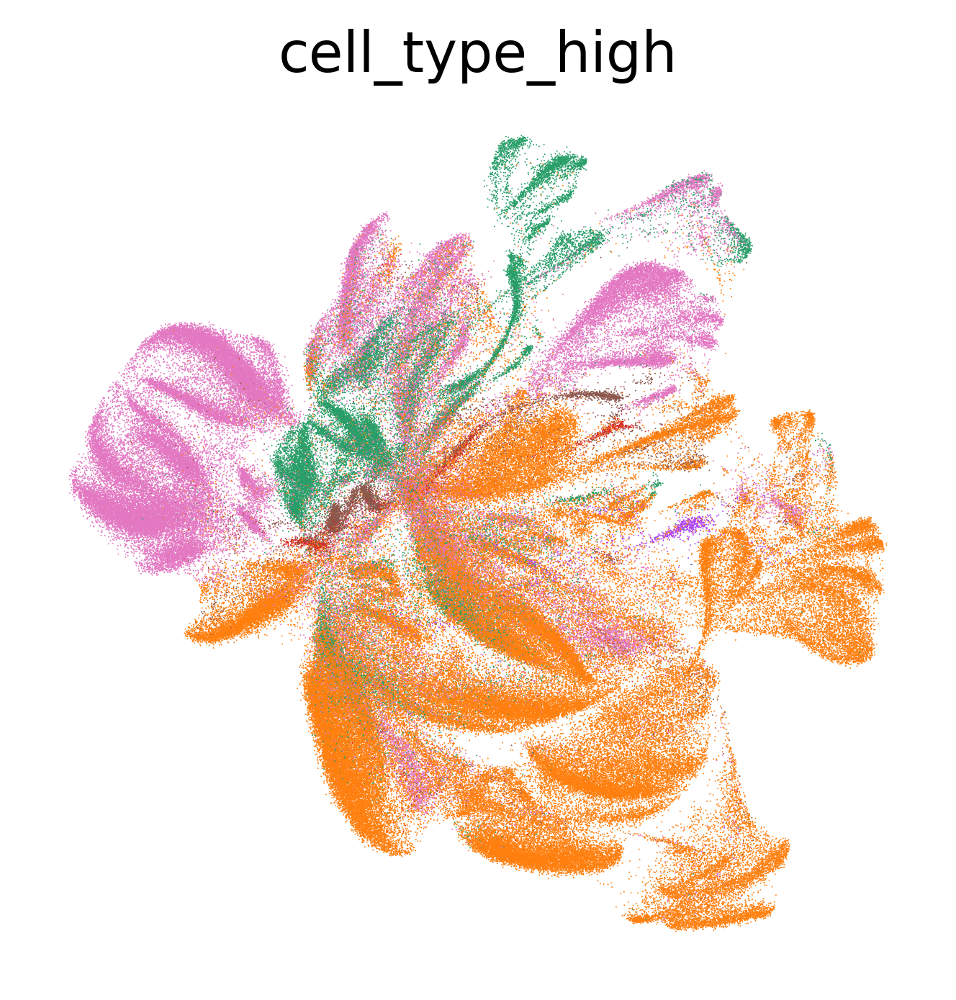

In [29]:
sc.pl.umap(adata_concat, color=['cell_type_high'], frameon=False, legend_loc = 'best')

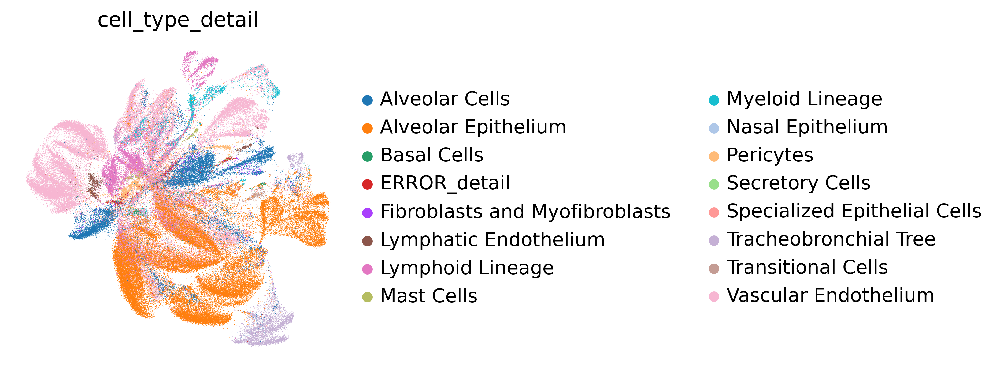

In [30]:
sc.pl.umap(adata_concat, color=['cell_type_detail'], wspace=0.5, frameon=False)

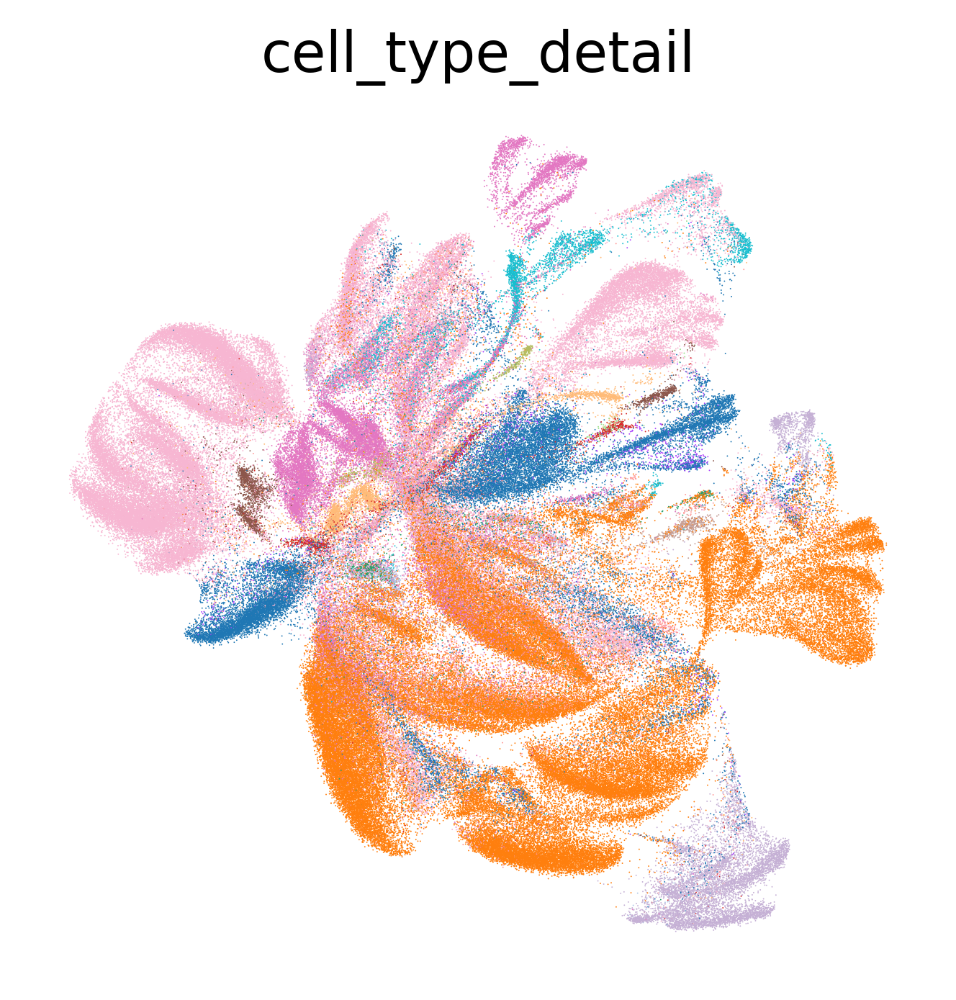

In [31]:
sc.pl.umap(adata_concat, color=['cell_type_detail'], frameon=False, legend_loc = 'best')